In [16]:
import random
import re
import numpy as np
import pandas as pd
import pytesseract
import matplotlib.pyplot as plt
import cv2 as cv
from typing import Optional
from scml.nlp import strip_punctuation, to_ascii_str

In [17]:
pytesseract.get_languages() 

['eng', 'osd']

In [18]:
pd.set_option("use_inf_as_na", True)
pd.set_option("display.max_columns", 9999)
pd.set_option("display.max_rows", 9999)
pd.set_option('max_colwidth', 1000)

In [19]:
train = pd.read_csv("input/train.csv", low_memory=False)
train.set_index("image", inplace=True, drop=False)
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34250 entries, 0000a68812bc7e98c42888dfb1c07da0.jpg to ffffa0ab2ae542357671e96254fa7167.jpg
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.6+ MB


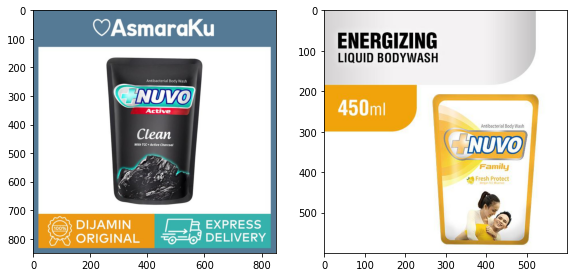

In [20]:
img = cv.imread("input/train_images/c491275ccb8696d578cb0594896238c5.jpg")
img2 = cv.imread("input/train_images/f54040911861cb1eeae35fe71877fba5.jpg")
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.subplot(1, 4, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

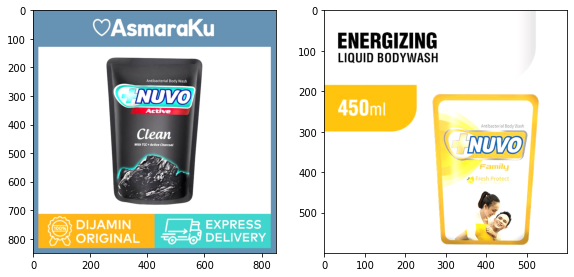

In [21]:
alpha = 1.2
beta = 0
img = cv.convertScaleAbs(img, alpha=alpha, beta=beta)
img2 = cv.convertScaleAbs(img2, alpha=alpha, beta=beta)
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.subplot(1, 4, 2)
plt.imshow(cv.cvtColor(img2, cv.COLOR_BGR2RGB))

img.shape=(850, 850)
h=850, w=850, scale=1.1764705882352942
h=600, w=600, scale=1.6666666666666667


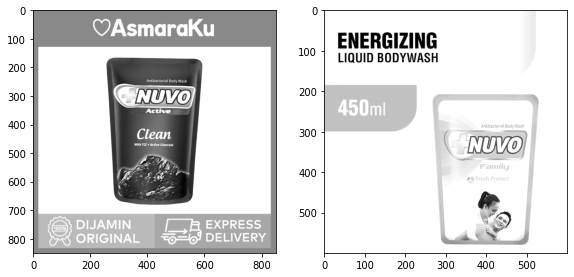

In [22]:
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)
print(f"img.shape={img.shape}")
h, w = img.shape[:2]
longer = max(h, w)
scale = 1000 / longer
print(f"h={h}, w={w}, scale={scale}")
#img = cv.resize(img, None, fx=1.2, fy=1.2, interpolation=cv.INTER_CUBIC)
#img = cv.resize(img, None, fx=scale, fy=scale, interpolation=cv.INTER_AREA)
h, w = img2.shape[:2]
longer = max(h, w)
scale = 1000 / longer
print(f"h={h}, w={w}, scale={scale}")
#img2 = cv.resize(img2, None, fx=1.2, fy=1.2, interpolation=cv.INTER_CUBIC)
#img2 = cv.resize(img2, None, fx=scale, fy=scale, interpolation=cv.INTER_AREA)
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(img, cmap="gray")
plt.subplot(1, 4, 2)
plt.imshow(img2, cmap="gray")

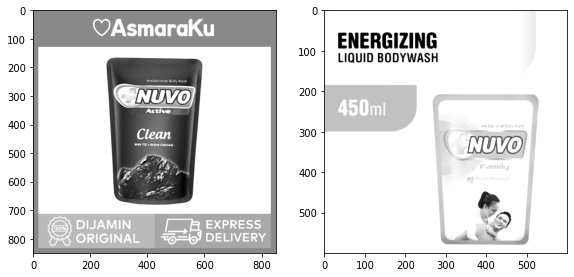

In [23]:
img = cv.medianBlur(img, 3)
img2 = cv.medianBlur(img2, 3)
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(img, cmap="gray")
plt.subplot(1, 4, 2)
plt.imshow(img2, cmap="gray")

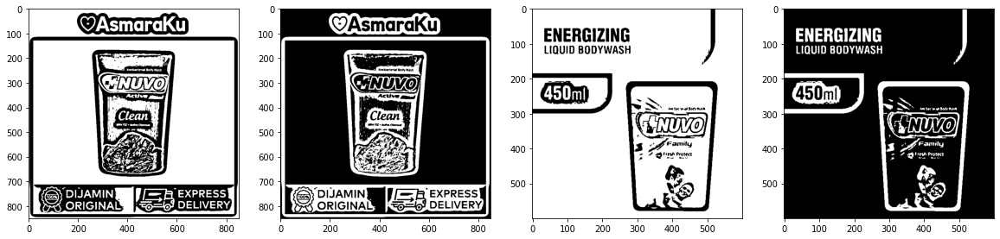

In [24]:
#_, b1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
#_, i1 = cv.threshold(img,127,255,cv.THRESH_BINARY_INV)
#_, b2 = cv.threshold(img2,127,255,cv.THRESH_BINARY)
#_, i2 = cv.threshold(img2,127,255,cv.THRESH_BINARY_INV)
b1 = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 41, 2)
i1 = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 41, 2)
b2 = cv.adaptiveThreshold(img2, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 41, 2)
i2 = cv.adaptiveThreshold(img2, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 41, 2)
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(b1, cmap="gray")
plt.subplot(1, 4, 2)
plt.imshow(i1, cmap="gray")
plt.subplot(1, 4, 3)
plt.imshow(b2, cmap="gray")
plt.subplot(1, 4, 4)
plt.imshow(i2, cmap="gray")

In [25]:
def erode_dilate(img):
    kernel = np.ones((2, 2), np.uint8)
    img = cv.erode(img, kernel, iterations=1)
    img = cv.dilate(img, kernel, iterations=1)
    return img

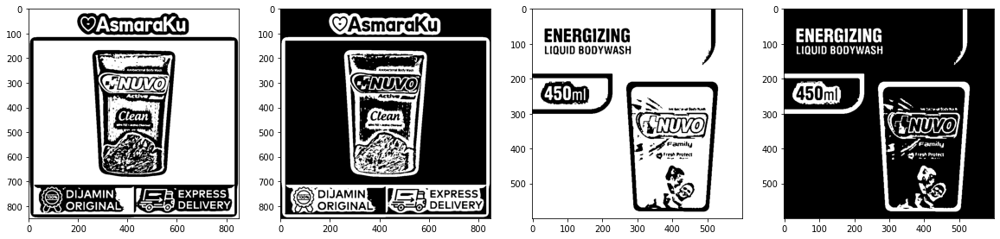

In [26]:
b1 = erode_dilate(b1)
i1 = erode_dilate(i1)
b2 = erode_dilate(b2)
i2 = erode_dilate(i2)
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.imshow(b1, cmap="gray")
plt.subplot(1, 4, 2)
plt.imshow(i1, cmap="gray")
plt.subplot(1, 4, 3)
plt.imshow(b2, cmap="gray")
plt.subplot(1, 4, 4)
plt.imshow(i2, cmap="gray")

In [27]:
config = r"--psm 11"
s1 = pytesseract.image_to_string(b1, timeout=0.4, config=config)
s1 = strip_punctuation(s1)
s1 = " ".join(s1.split())
s2 = pytesseract.image_to_string(i1, timeout=0.4, config=config)
s2 = strip_punctuation(s2)
s2 = " ".join(s2.split())
print(f"s1={s1}\ns2={s2}\n")
s1 = pytesseract.image_to_string(b2, timeout=0.4, config=config)
s1 = strip_punctuation(s1)
s1 = " ".join(s1.split())
s2 = pytesseract.image_to_string(i2, timeout=0.4, config=config)
s2 = strip_punctuation(s2)
s2 = " ".join(s2.split())
print(f"s1={s1}\ns2={s2}\n")

s1=GNUVO Be Dh Tid ara Ad aia Ree ivf wee es DIJAMIN EXPRESS i tad ORIGINAL Pea as
s2=es C Anatbacteriat Body Wash Cel Active gad etek Fer » Active Cherenat Clean ee “is He oR ae OL DIJAMIN EXPRESS 7 ORIGINAL DELIVERY

s1=ENERGIZING LIQUID BODYWASH Gin SO erconene ELIE LAM i 7 etter Protect XS
s2=SALT MTU RT AEN ory SS reread Oz NUVO Family ar alec ey



In [28]:
def image_to_text(img_path, mode: str, timeout: float, neighbours: int=41) -> Optional[str]:
    s1, s2 = None, None
    img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
    #img = cv.resize(img, None, fx=0.5, fy=0.5, interpolation=cv.INTER_AREA)
    img = cv.medianBlur(img, 3)
    if mode == "binary_inverted" or mode == "binary":
        th = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, neighbours, 2)
        th = erode_dilate(th)
        try:
            s1 = pytesseract.image_to_string(th, timeout=timeout, config=r"--psm 11")
        except:
            s1 = None
    if mode == "binary_inverted" or mode == "inverted":
        th = cv.adaptiveThreshold(img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, neighbours, 2)
        th = erode_dilate(th)
        try:
            s2 = pytesseract.image_to_string(th, timeout=timeout, config=r"--psm 11")
        except:
            s2 = None
    if s1 is None and s2 is None:
        return None
    tokens = []
    if s1 is not None:
        s1 = to_ascii_str(s1)
        s1 = strip_punctuation(s1)
        tokens += s1.split()
    tokens.append("=============")
    if s2 is not None:
        s2 = to_ascii_str(s2)
        s2 = strip_punctuation(s2)
        tokens += s2.split()
    return " ".join(tokens)

In [29]:
def plot_images(group):
    plot_list = train[train['label_group'] == group]
    plot_list = plot_list['image'].tolist()
    images_number = len(plot_list)
    size = int(np.sqrt(images_number))
    if size * size < images_number:
        size += 1
    plt.figure(figsize=(20, 20))
    i = 1
    print(f"group={group}")
    for image_id in plot_list:
        plt.subplot(size, size, i)
        img_path = f"input/train_images/{image_id}"
        original = cv.imread(img_path)
        plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
        plt.title(image_id, fontsize=9)
        plt.axis("off")
        ocr = image_to_text(img_path, mode="binary_inverted", timeout=0.5, neighbours=41)
        if ocr is None:
            ocr = "TIMEOUT"
        title = train.loc[image_id, "title"]
        print(f"i={i}\ntitle={title}\nocr={ocr}")
        i += 1
    plt.show()

group=1105046574
i=1
title=NEW !!!! SANDAL SLOP KARET ELMO CHAMPION
ocr=TIMEOUT
i=2
title=Sandal Selop karet ELMO TEBAL PUTIH
ocr=t ig w ary eee AN Ps a wr wth Sx NaN 4 U a eo see WS VU wie Akai ix GS ow a By T Fetes y ie te we aw Fa hy C P Ze te are Ey BoA ay 2 imu at Ye wig Ae ay Oe eo a wh 53 we OZ Ee gz oe ZZ ne Lf ig my te fs i Se GE fie ============= uw a ae ly NY Y NN pa RAN e te ee CS U ats Coad LAE Ne ae om a as ole od Zoe Fs ae eg le ees i 3 le LE preg


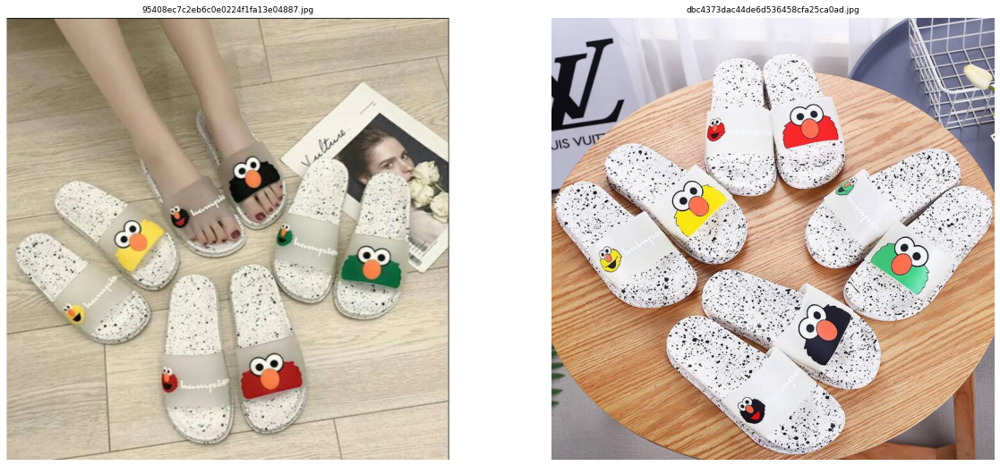

In [30]:
label_groups = list(set(train["label_group"]))
lg = 1105046574
plot_images(lg)

group=1797968020
i=1
title=JESINA DRESS MAYOUTFIT
ocr=TIMEOUT
i=2
title=JESINA DRESS
ocr=TIMEOUT


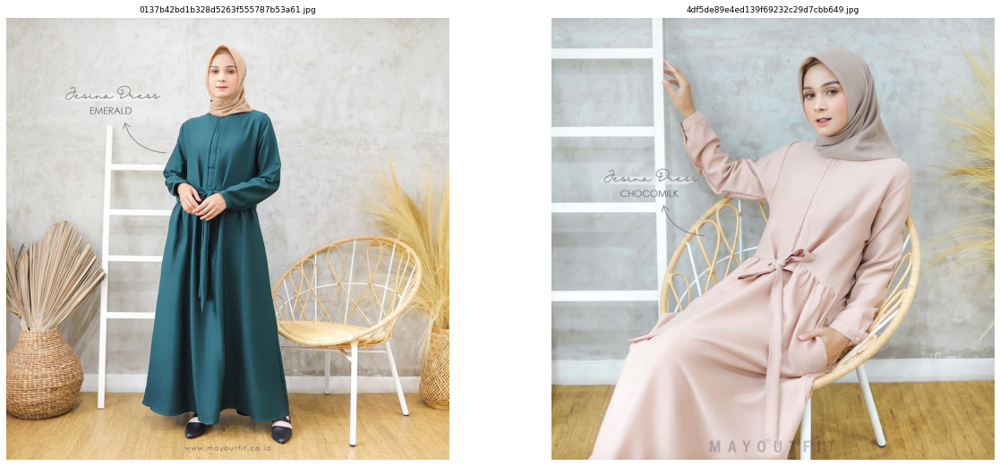

In [31]:
lg = 1797968020
plot_images(lg)

group=2834147202
i=1
title=Bohobaby new colors NB,0-3M,3-6M,6-12M
ocr=R 72K I za FRA ie AAT cation we ============= ae IDR 72K ae aL aif altel erg a TA peice i
i=2
title=Sleepsuit Zipper by Bohobaby 1-2Y
ocr=03M 36M 612M gleeP IDR85K er 1 2 IDR 88K oe Nae 4 ikl pa dasty rose ast pak a rer terraceta aaron moby rrr eons Co denim co BOHO J BABI KS ============= ULAR Dag P Cg ae Eg a aa al ai Bis ai ae ql ia dasty rr oo a ett Sele ted Ce dal ity tr ae and Pci Cr re UE EAS


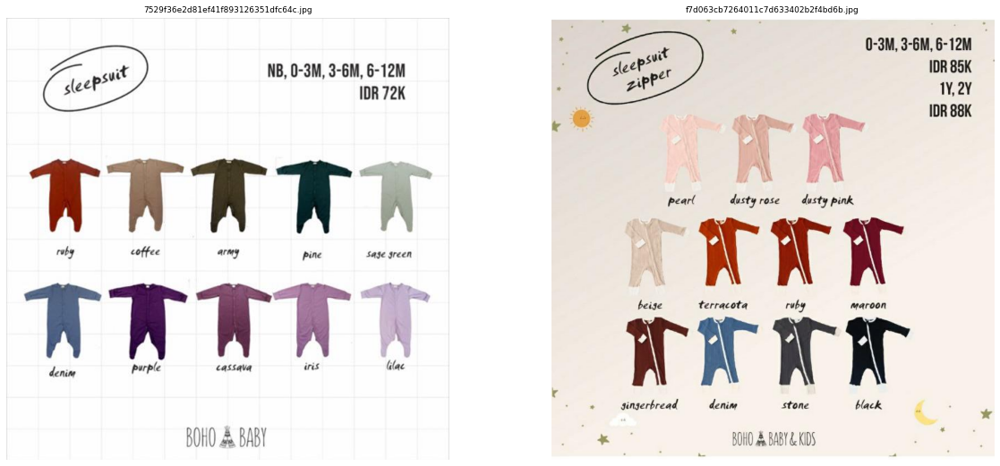

In [32]:
lg = 2834147202
plot_images(lg)

group=1184765528
i=1
title=Kurma Date Crown Khalas Vacum 250gr Manis Enak Cocok Untuk Oleh oleh Haji Umroh dan Buka Puasa
ocr=TIMEOUT
i=2
title=Kurma Date Crown Khalas Vacum 250gr Manis Enak Cocok Untuk Oleh oleh Haji Umroh dan Buka Puasa
ocr=Oleholeh Haji Umroh Khalas Vacum Berat 250gr ae ae rec tae at xs ae j 2 ex fe bar eh ey Pad a a a Cael geet wae eet PN acer a rs weir at te ed F aiid Pj aa i ee wrest ae ee frag e 9E BS eas zl CL TTT ============= Oleholeh Haji Umroh Khalas Vacum er onl gam ee Eee at a a Sean 7 axl rd i ah ed ry 3 Lane e ES pe dha a ey ets at P le ay mel e rans Fae pees as A fi ray it eee rim SK Pr Bursa Haji
i=3
title=Kurma KHALAS / Kurma Kholas Premium Original Oleh Oleh Haji dan Umroh
ocr=ev pats Hafi On aE Ca 2g ov Ua od RES DR ay Care Be Cork et ts me Xe A yi Nar ry es Se ease are vy py a se ============= ra Dunia Haj av on Sy ue in ae ees e ue ES o a aS NTASHE at A 3 AL ook 7 a Nah Le ond SB ee ee ee


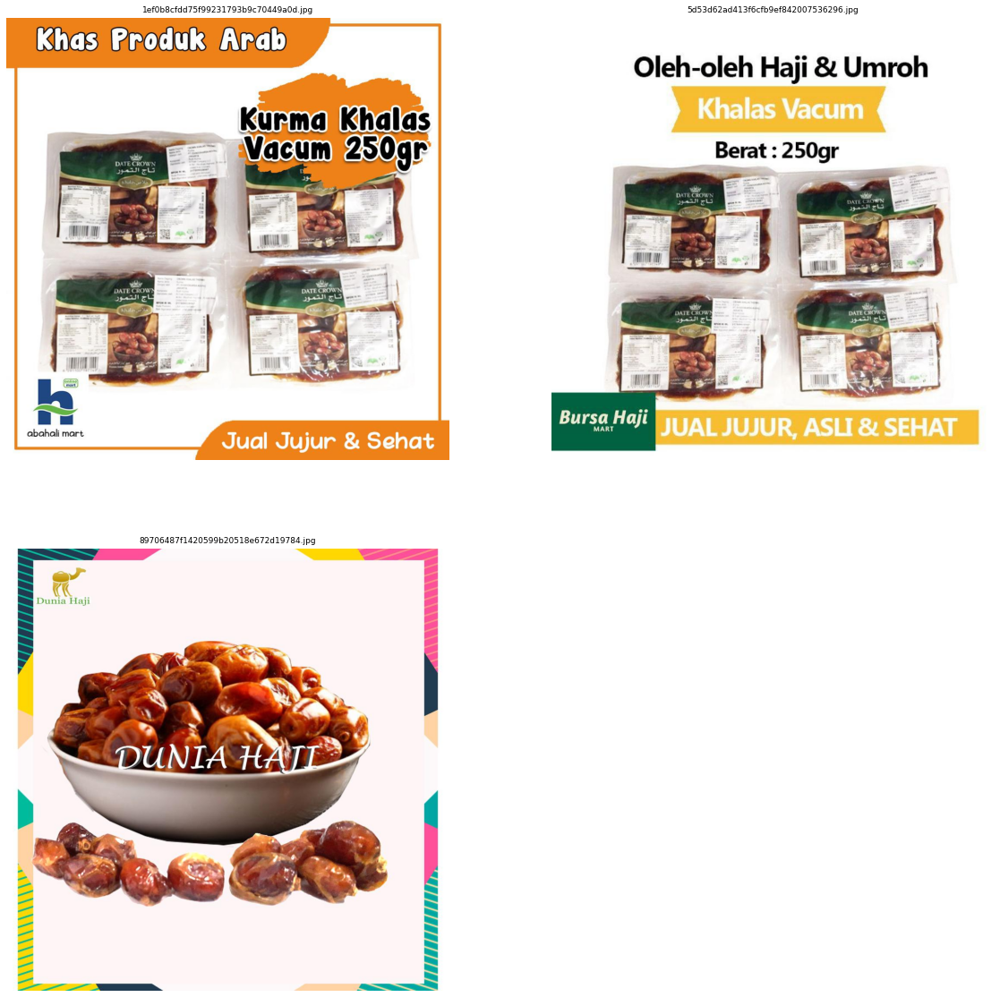

In [33]:
lg = 1184765528
plot_images(lg)

group=3080175352
i=1
title=Cairan Pembersih Softlens O2 MPS 160ml JK
ocr=a F T 1 ee an Le ceed a cael CRIS etn enh oakah bet erties4 MinOne Solution bee heel ery ============= a oe gepad en a A TM a MinOne Solution Sena staan bee we it a
i=2
title=CAIRAN SOFTLENS OXIFIVE/O2 MPS 160 ml
ocr=E oe s eH TM J ee rey 5 ae hal with OXY GEN mt Raunt aie reel Shoanaed we aah gt err ============= C at aoen ia eta ore i Am Prpose Bence ipa woos Lens Cale By oath Semen sisgecns 2000 Mi ans me Vv cannes 0 ae
i=3
title=image
6be9470c7ea9fae7e2af24217a0b784e.jpg                     ( Exp 10/10/2024 )HARGA MURAH CAIRAN O2 160ml
6be9470c7ea9fae7e2af24217a0b784e.jpg    Cairan soflen Air soflen oksigen O2 160ml all in one solutions
6be9470c7ea9fae7e2af24217a0b784e.jpg                                        Cairan softlens O2 MPS 160
Name: title, dtype: object
ocr=a e y iY o Legace tenant EK ATL pate ee bat re 4 tpldeaapettave Oy ery ee ============= Le oS 1 thm rwpces Senet ywrn OXYGEN tera tan Demme Nt t

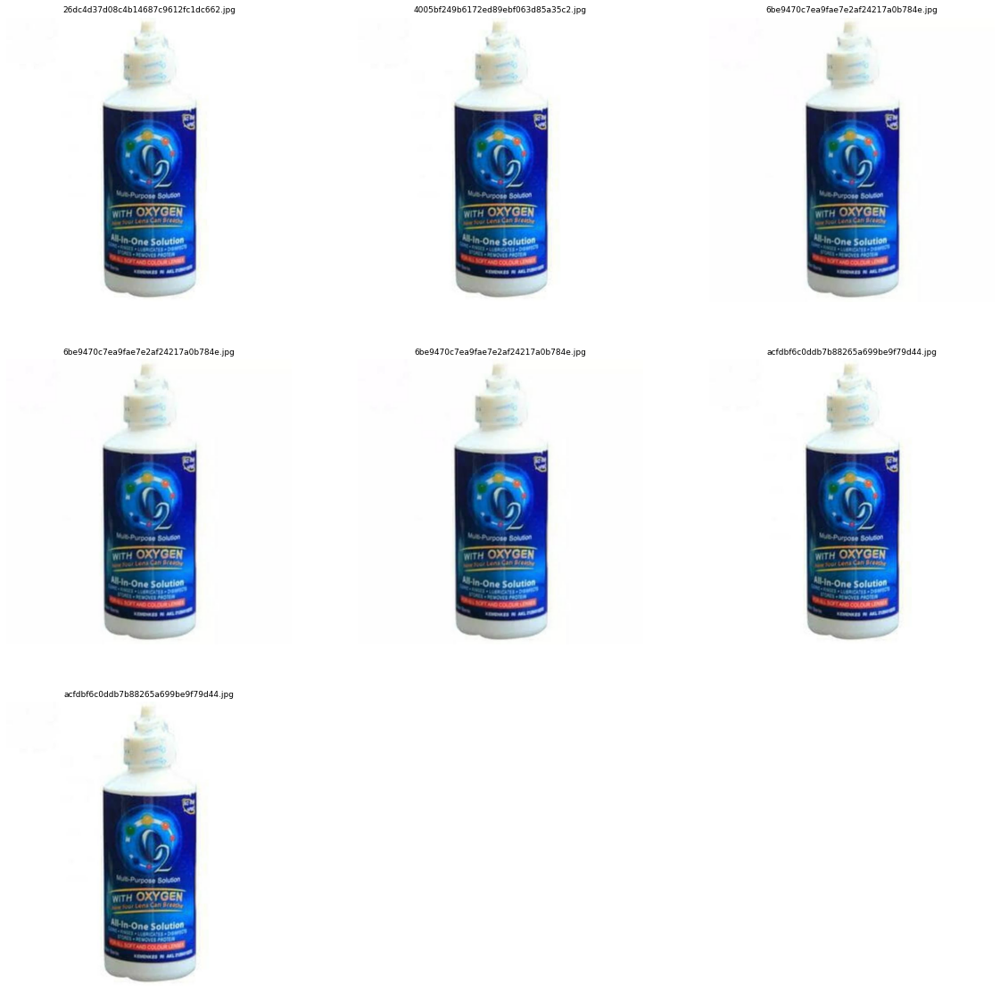

In [34]:
lg = 3080175352
plot_images(lg)

group=1664694453
i=1
title=Sabun Bidara plus VCO 20 gram BPOM
ocr=ye 5 Aes San ey ioe 2G a Ta Bs yi eS i 4 SICARa POT keer isa af i iy yA 3 etto 20 sae fe vi Ape oa ef Ame amas eye tee ae AN Mamie att ============= FN Oe KE ae ar ann 4 Ts n x7 My Ca 7 PAV a ee ee Gs ea ie YsabunE AY v5 iclara w Vi In Coconut Ol ed yf i W Caeser ig i Ah S Ve care ee Erin ff Be ro rh ne Paar a
i=2
title=Sabun Bidara Plus VCO 20 Gram BPOM - Sabun Bidara Plus Collagen
ocr=Sal Saad oe he a ne a7 i iddifa Expired Date Ke November 2021 wd ROMINATS1 maton wae wet 3 erm Ws Amy eee ae ============= an ea fs ee Tl a B U ik rey 7 4 erie ia oer 2021 BOMINAN8119050004 1 ard 20 gram Cal 2 wa


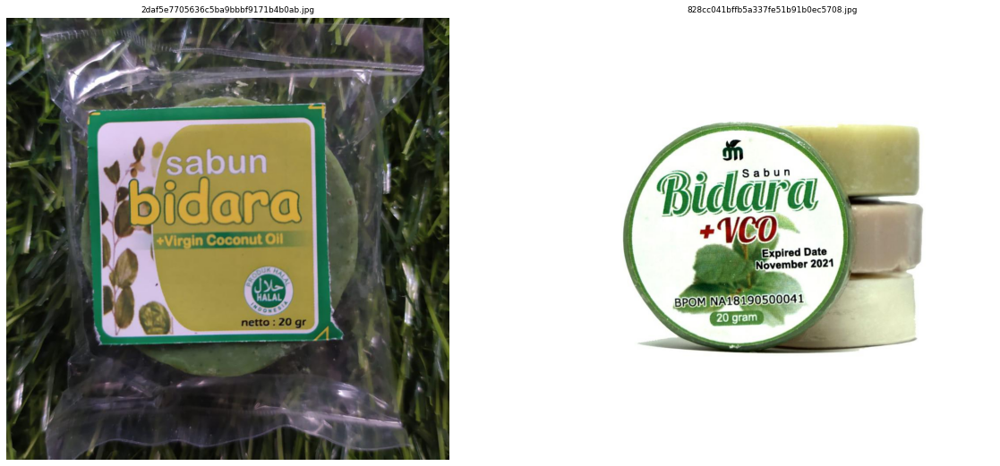

In [35]:
lg = 1664694453
plot_images(lg)

group=888840128
i=1
title=BUKU ANAK BACALAH 1-3 CARA CEPAT BELAJAR SEPAKET (GROSIR)
ocr=eee ay jee Aft 7 tem Hat re q KS rT gaaaG Ww ala ve ah jo pas Seteter Membaca en os TN Nc Q pe wercs ios une Bacalah oi erabeee teas 172 mee ee eee SS ee ============= ae 7 Cc gor nd Oo peer err emer alah Ua Cooney Be 2 el 1s ned QO Soo 3 aye aero fo pe geoprlei ee een sees
i=2
title=BUKU ANAK BACALAH 1-3 / PAKET CARA CEPAT BELAJAR MEMBACA 1-3
ocr=Hargaluntukpaketgl23 Po mags Re rane te AS ce tS laht 2 oo ry 4 ei he bid great setares memeecey no 4 e at raters ite weve ce aw 3 pen Bacalahi Oe athe Kirnantitxeriits ============= Hargaluntukpaketgl23 Se oem 5 oC rE ta Os Jen hf pCa POUR roue ay 3 We eed ie 2 fe a t Corte el en Che eee domme ed een ewan Kirnamtinernils
i=3
title=PAKET 3 BUKU BACALAH CARA CEPAT BELAJAR MEMBACA
ocr=Chnga omtidk pelkat 129 5 oT abn ee Oe owe a ac wee gat aS ae 5 he xr os ae wT NZ oe LC Sy alah 2 4 oa Ren he epet wetapar sanvace Senn eet OF SAY Nat oe permioce ube cement Ba

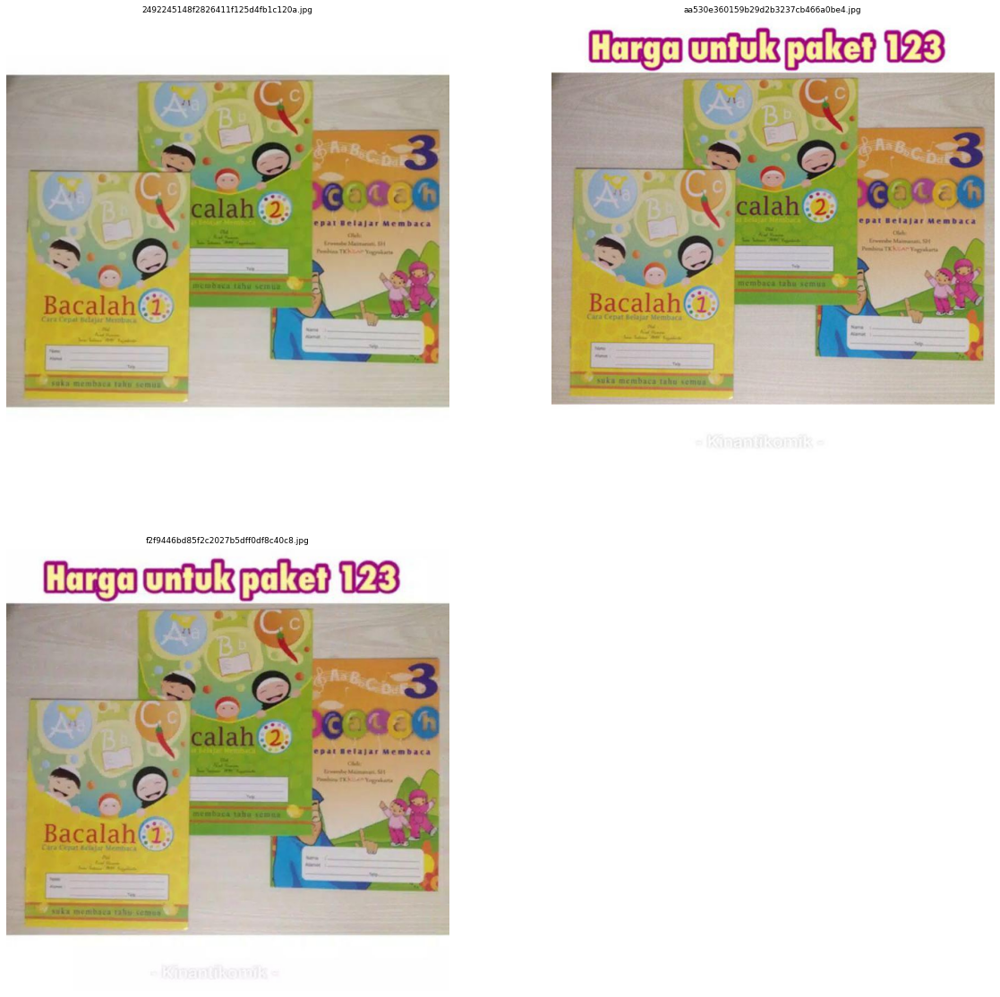

In [36]:
lg = 888840128
plot_images(lg)

group=3440859311
i=1
title=FLEXIBLE BITS (Jhum) Ekstensi Mata Bor/Obeng Elektrik Dengan Bahan Fleksibel
ocr=pare a AM id Ng at bin a AS one ar i bites Vb qi ly eh i uA Le yy af ib 4 his FY et wr eel SALEYF OOS ============= oes ert a Se F Tenn penne bing i ba recat La Gage Ss ae bf i Wa a et oY he i i es WY ot er ond OF iY VYav SALELETFAST SHIPPING
i=2
title=295mm Flexible Shaft Bit Extention Screwdriver Drill Bit Holder Connect Link for Electronic Drill
ocr=OS wen we aa i Ss L es GR a AN betas Lana Yt WL basta el ry 4 FONE i e db ae 4 oo I Ca lt s OT bes Wire ============= a 7 i SES MO 3 n aN Pag wen Vers A 2 4 Lal 4 ey fh dh a ahs Pe k 9 ye We N Mn Vo a Cm HAAN


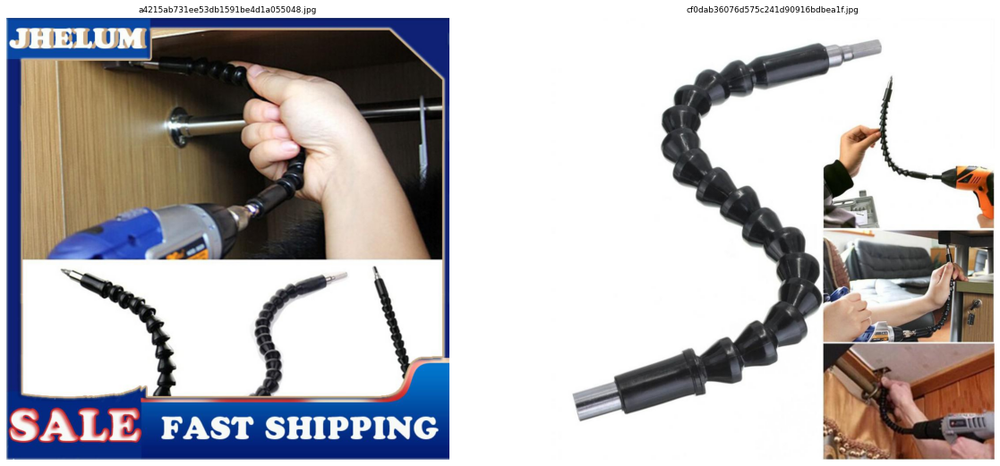

In [37]:
lg = 3440859311
plot_images(lg)

group=613369054
i=1
title=DNM Urban Lip Cream Matte Glitter Shimmer Warna Warni Anti Air (Matte Lipcream Dengan Warna Intens)
ocr=yA I ES is iQ fi pl ============= NY PI es
i=2
title=DNM Lip Gloss Glitter Shimmer Warna Warni Anti Air
ocr=ARON AEN VENI Nd fis NY be Ned a7 oe w06 on 07 08 TNA ATE NJ i Nl 57 Med Sv OL 02 03 04 05 06 O7 08 09 10 11 12 baa i ay by I A iy if Fi li FH ============= FASTA Sn AS Ae Ee U ANG V4 ow PAC PLN SrA era ihe ee
i=3
title=COD DNM Lipstick Cair / Lipgloss Matte Velvet Anti Air Tidak Lengket
ocr=1 at ============= l


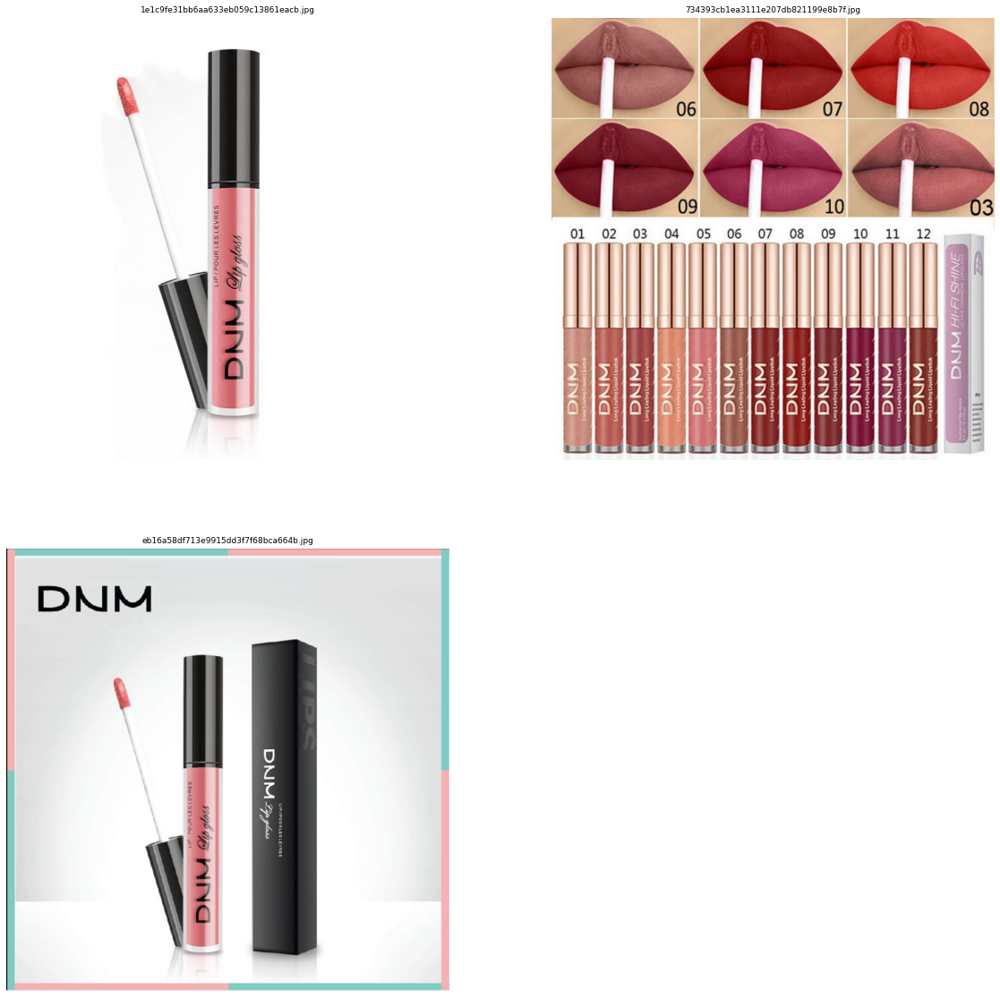

In [38]:
lg = 613369054
plot_images(lg)

group=681061245
i=1
title=Bibit alpukat markus super Jumbo cepat berbuah
ocr=oe m AFP ATOR AN eal oa moe ta Cis lad US ade aca a Dy e es ee rey re 1 We 4 4 ws eek at ats ay 9 te take oN Sod 54 ria bre eae cj rr a Er Pr le wee Ne 2 aw oN Pre ts aN Mae Bem wan gi 2 ae dw vy TM ae La Le wee h ew ee cn oy wt eee Pe AA i 3 ee Liga ============= pr oe a cad at Sal ANN eam Hil enna a a Markus ne om hese ea f Ga pre ra at oe x ty Pi re Gs ae a3 23 oP de od we vl Par TY vt ae fret pe 7 a Be i tre aa pom er tre as 2 ane ae ar er a4 od ae A en oy va i M e ee a haan NC eer xs oe al fred Kary eins a fad ee 2 Ke bs s xP iy
i=2
title=Bibit alpukat markus super jumbo cepat berbuah
ocr=at on why se 3 C Fe ik Ww oA wane aN WN re rm t X fi He fi Fz tae oa 4 Foe tee ow te bey fo ye ml a5 os 2 fi iF fa y ohm ty f ed O68 Mose Che ce te Oy we M 2 Qiicsine ce 7 ae7 she D iI at 2 ho P a ge yt wf ag VF ew oe Z4 ============= od om a soe Pai 2 Masa aod aX ull AUD ied of 6 ie fi ea co aan ar ee ras el arr rs on r

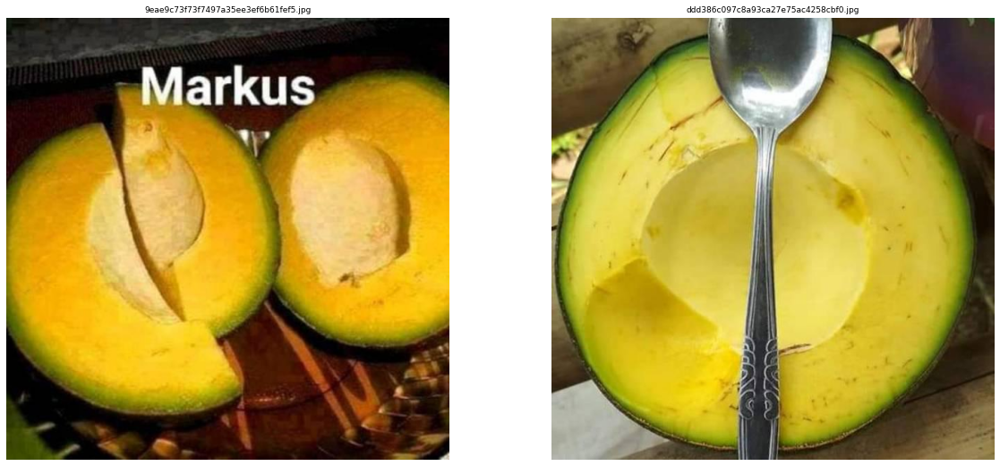

In [39]:
lg = 681061245
plot_images(lg)

group=283827364
i=1
title=Make Over Perfect Cover Two Way Cake / Bedak Make Over / Make Over Powder
ocr=es ne wt 3 a Ie sy Y aoe Mie uy os sf Bee st Ze ate fey ve i a a ============= mm tS Se ee
i=2
title=Make Over ( REFILL ) Perfect Cover Two Way Cake
ocr=ig a A Ct aud Ld dd oe y WP a ============= ig eed An Lar Vi hea Bema


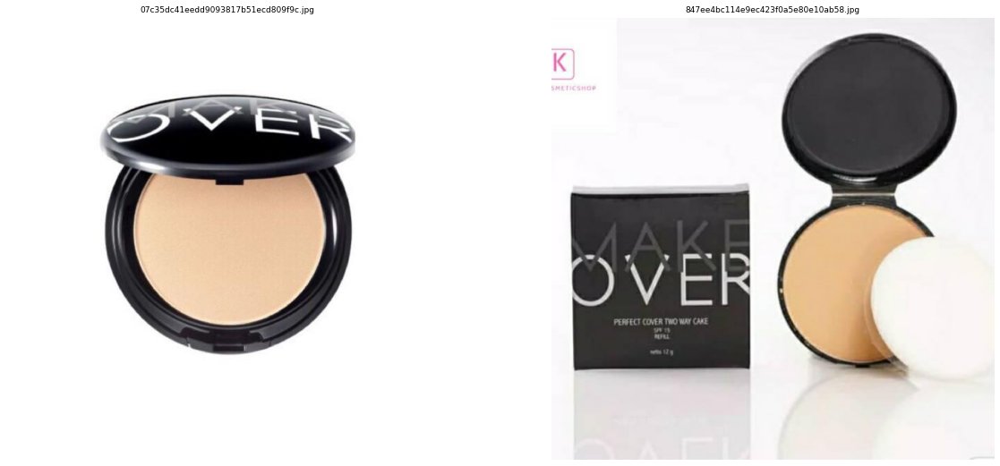

In [40]:
lg = 283827364
plot_images(lg)

group=940172493
i=1
title=Sabun Mandi Cair Nuvo Active Clean Pouch - 450 mL
ocr=NUVO aed Dh Tid erat en at re a ot es g IRANI EXPRESS ies we ORIGINAL DELIVERY ============= e NUVO Clean etek Fer Active Cherenat 4 YS Seeger He et OLE DIJAMIN EXPRESS TX ORIGINAL DELIVERY
i=2
title=Nuvo Liquid Soap Family Fress Protect 450ml
ocr=ENERGIZING LIQUID BODYWASH Gm SX SNUG Nuvo ame S ============= ENERGIZING RR Te ES a Wee CINE er an ae eda a


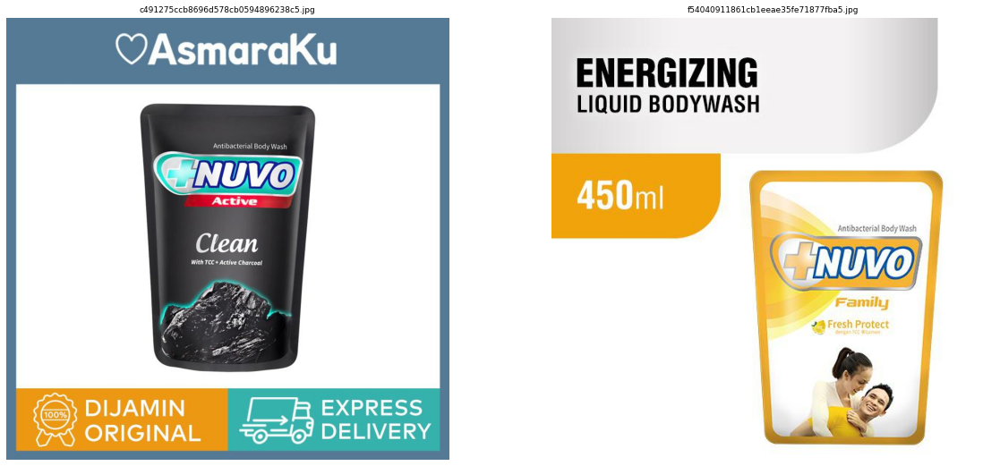

In [41]:
lg = 940172493
plot_images(lg)

group=847540749
i=1
title=Sunlight Jeruk Nipis 100 750ml Botol || Pencuci Piring
ocr=EE gg eee ha ir Rens ey nvighty JEAUH Ni et fete oD Eh EY tr ============= ra oO a ea plight PA EAU NIP OO 750 ai Bl Ymll
i=2
title=Sunlight Lime Botol 750Ml
ocr=iw Roges re fone Ne rt Be i ett TU ae stolom N x Ue Bey Gal ============= ans So oc See Co nes NM ican mfg 1004 S 15 Sey mil


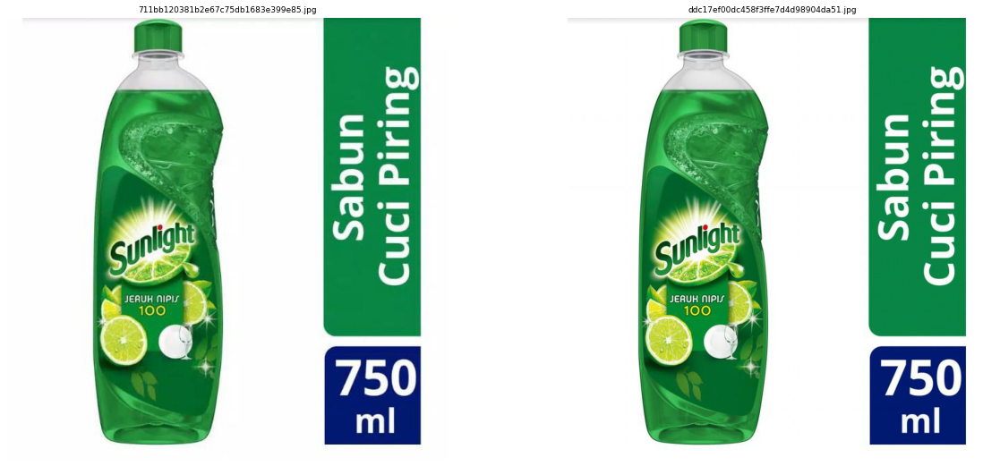

In [42]:
lg = 847540749
plot_images(lg)

group=3121905605
i=1
title=BLOK TAS - MAINAN EDUKASI MAINAN BONGKAR PASANG BLOK
ocr=hs f NO BES 3285 Pitas is Se try oa beds ============= Colhagy VS I peak Cade 3s ag rN AGES eye Oe ey
i=2
title=MAINAN EDUKASI LEGO BLOCK TAS RANSEL ISI 102 PCS
ocr=alt a i Um aS pa 34 ea Aes 0 Kes Ch ee oC s oy i eos oN Ty I mn ============= Enllsay a Aa lag om 8 k Se wee en Aas Cit as tt a Ww x yy Ss 4 ie ee
i=3
title=Mainan Lego Blocks Ransel Edukasi Bongkar Pasang
ocr=BAYAR wT DI TEMPAT es ey Se A fa tally a ad a Lo Ce i ay tr yey ar Sg an ae yy i oa 3 Vo Ce Lf e rs a r Ye Sr 17 CN CX Lee ii Q Koa AGES 34 ae OS rere i te 54 ee RES ce TS 3 C22 Laer Sean a ============= BAYAR tae BOK GV Di TEMPAT a 3 ys yp tall OG rw ws err G 33 wAnre Saal i 4 AGES ent ae 1 En lsh enn a eS s y o s 1 aioe ORGuoRNa sg Seat a a ee Y rd i J ah 5 oye oo e Cs e 0 ea brent of
i=4
title=MAINAN EDUKATIF ANAK LEGO BLOCK TAS
ocr=ae Cas R am Clad LP a Us y a i ua AGES e Ke WED uo OZ hs Cae Ses Sy S AN pi eee NLS Si Aste Sa S wo c

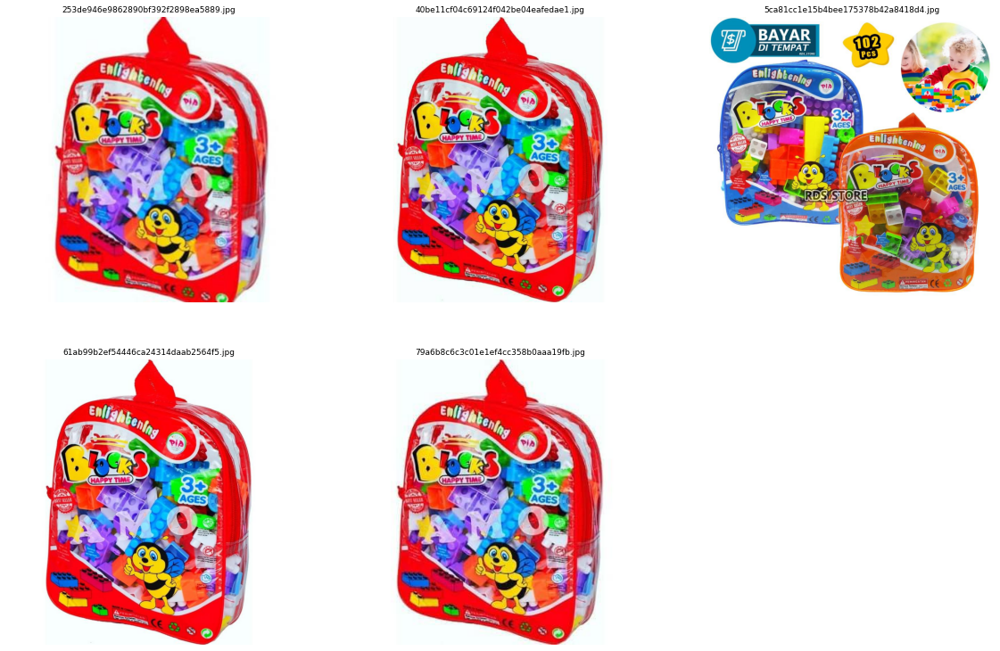

In [43]:
lg = 3121905605
plot_images(lg)

group=3979333992
i=1
title=MASKER ORGANIK YOURA OAT PREMIUM MASK 15GR
ocr=A Qat Premium Face fiz ip mere eis 8 a ============= ey Raa sald Sats Rs as Cr a Ne sy an jam Eve Br oe
i=2
title=(DIST. RESMI) LAFALOVA ORGANIK PETALS OAT PREMIUM MASK 15gr
ocr=py NALGU COED Sy LAFASBIME Masker Oreanic Petals Oat Premium Muy TOL ptag Plates Re att Quimey sf jad AY are ae Al w aie nb phen Pe UN Sunes sta eae ============= CE 2OO5O5658 2e2OeOses Qa RU 2O7O7 Sees Ds e Masker Oreanic Petals Oat Premium y 4 i aR ay a ed ie Ke ay oe poeta Sen lees a oe 2 eo
i=3
title=YOURA OAT PREMIUM MASK 15GR
ocr=ane r aR ad Bee ee a ale ============= a 6 an teat wa Bory eat Sion ms me rs Y 6 raed roy oe wg ened ee CE AY poems Seid romani wel 4 om
i=4
title=[DIST RESMI] MASKER ORGANIK PETALS OATS PREMIUM BY LAFALOVA | MASKER LAFALOVA
ocr=Masker Organik Petals Oats Premium ce PF tee Uo RETA om fe AS oe FF AAC VEX Be a RY Oh See lane ============= Petals Oats Premium Masker Organik aan Pe eg ral bane ce a sect Beat a 

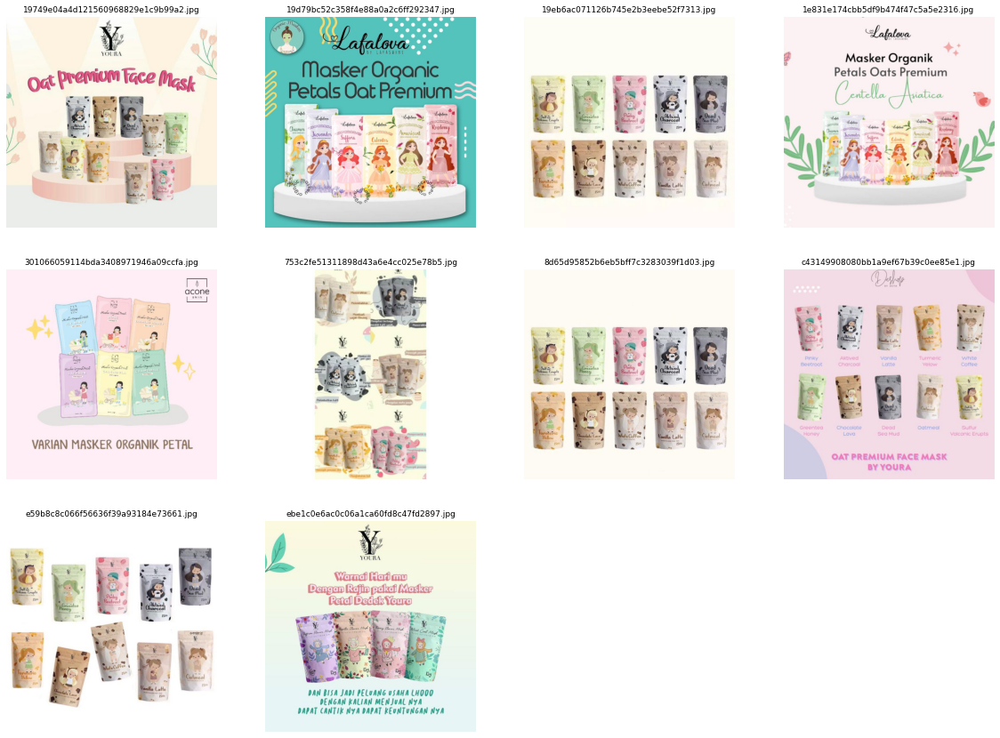

In [44]:
lg = 3979333992
plot_images(lg)

group=1806236557
i=1
title=Boneka mini,  hiasan tas,  aksesoris tas
ocr=oe te x on rae tae TS Mot Ot a5 es oS me se te om ed mek ete ea wr as pwn 7 e re ve ewes wee xX a ee 8 26m whe 22 ws Ca Fy ae ae er Me dd 2 NI en as A Y We a js 1D Ce f AS ae te we TM oon Fa ae rapa f ee 4 wt Nee L as wed St nts ne te he te nas pe rae ea ============= nae pay v ara a a on e ea rs eae Pe ve Tn a 2 PES a 8 oe Epon Ps wan 3s o rs cy a oS a 2 g a con F Hi aay NSF ee ah oa ZF wm a 4 es 4 Lorre pond a ia
i=2
title=Aksesoris tas gantungan boneka
ocr=af af 4 ee mothe oy set ae te we ats te ou ek a iden 8 e 8 it top sa o a Po en vv BO aa Wen ee SA Y er te v p re wm ewe a wa ott ne te det J wilh 7 ============= a 0 a owt rere can Ly AR ey o Le yy La Rares ead ad a 6 a es Rey ae Pot Mm re mas y f fy kD rom wo wa ey a ay ee a oa ano af
i=3
title=Gantungan Boneka Cute 3 Pilihan Warna Random Kekinian gantungan tas murah By Kitinkshop92 Murah
ocr=Ist vr Shopee rN ff e we oe Ne tS FV Low al ene AT 9 2S ===========

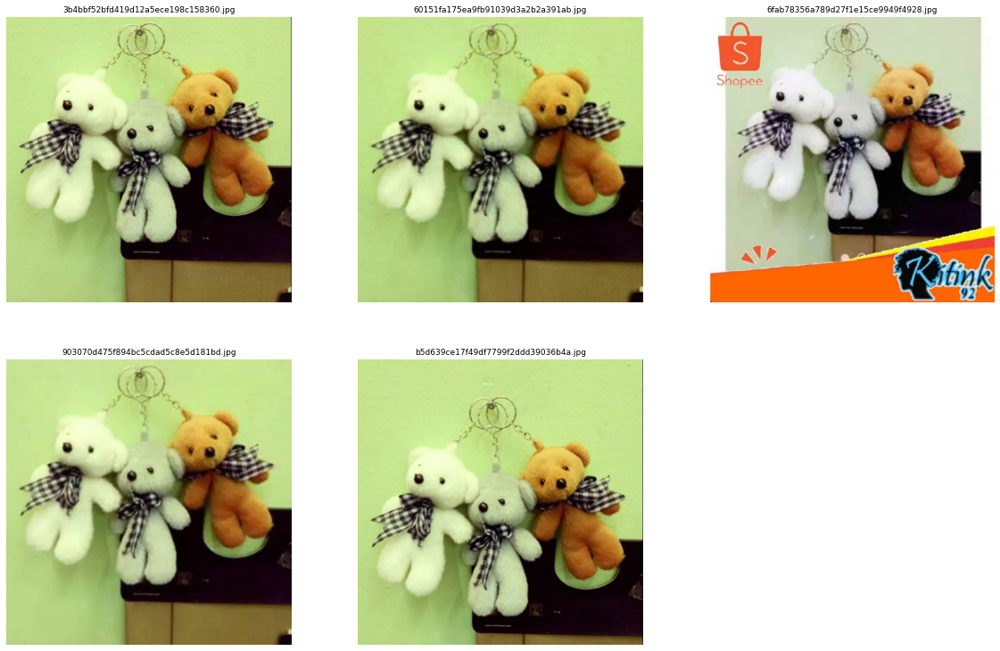

In [45]:
lg = random.choice(label_groups)
plot_images(lg)